## A Summary of Findings on Rainfall in St Louis

The first step in looking at the data from any city and time span is loading it into the notebook for use. All of the data for St Louis are available in the input folder of this repo and on Google Drive. Eventually we want to move to hosting the notebook on the same server that hosts the data, so that everyone can be working on the same version of the data and making tweaks when they find faulty values. This could be a physical server or a cloud based one.  

First we load our classes and methods from the python scripts in this repo:

In [1]:
from __init__ import *
from rain import *
from common import *

Then we set up our notebook to plot inline and to incorporate functionality such as zoom.

In [2]:
%matplotlib inline
import mpld3 

In [3]:
%load_ext autoreload
%aimport rain
%aimport common

Once our notebook is set up and all our packages are loaded, we can finally load the data. In St Louis, we had access to data from 21 gages from 2000 to 2006 recording at 10 minute intervals, and 101 gages from 2009 to 2014 recording at 15 minute intervals. Each of these sets of rain gages had corresponding radar rainfall data. From 2000 to 2006, the gages only recorded positive data, so there is a possibility that the values are underpredictions of the actual rainfall because a non-functioning gage would show up as a 0 instead of a NaN

In [4]:
path = './input/'

rg = Rain(path=path, name='StLouis_MSD_gage_{YEAR}.csv', year=range(2009, 2015), ngages=101)
rad = Rain(path=path, name='StLouis_MSD_radar_{YEAR}.csv', year=range(2009, 2015), ngages=101)
rg.ll_file = 'StLouis_MSD_lat_lon_{YEAR}.csv'.format(YEAR=rg.year)

rg.get_ll(cols=['lat','lon'])
rad.ll = rg.ll

In [5]:
rg21 = Rain(path=path, name='StLouis_MSD21_gage_{YEAR}.csv', year=range(2000, 2007), ngages=21, freq='10min', per_hour=6)
rad21 = Rain(path=path, name='StLouis_MSD21_radar_{YEAR}.csv', year=range(2000, 2007), ngages=21, freq='15min', per_hour=4)
rg21.ll_file = 'StLouis_MSD21_lat_lon.csv'

rg21.get_ll(cols=['lat','lon'])
rad21.ll = rg21.ll

Since the gage data are at 10min step and the radar are at a 15min step, we need to bring them both to 30min before we can compare them well.

In [6]:
rg21.reset_rate('30min')
rad21.reset_rate('30min')

We will also want to specify a folder into which all of the plots and maps will be saved for static viewing later.

In [7]:
rg.save_path = rad_save_path = rg21.save_path = rad21.save_path = './output/StLouis Summary/'

The spatial range of these gages is similar: 

In [8]:
fig = plt.figure(figsize= (8,6))
ax = plt.axes(xlim=(-90.7, -90.1), ylim=(38.4, 38.9))
scatter1 = ax.scatter(x=rg.ll['lon'], y=rg.ll['lat'], s=100, c='blue')
scatter2 = ax.scatter(x=rg21.ll['lon'], y=rg21.ll['lat'], s=100, c='red')
tooltip1 = mpld3.plugins.PointLabelTooltip(scatter1, labels=list(rg.ll.RG.values))
tooltip2 = mpld3.plugins.PointLabelTooltip(scatter2, labels=list(rg21.ll.RG.values))
mpld3.plugins.connect(fig, tooltip1)
mpld3.plugins.connect(fig, tooltip2)
plt.savefig(rg.save_path+'Map of 21 versus 101 gages.jpg')
mpld3.display(fig)

The first thing that we would naturally want to do, is see how well the gage and the radar data match each other. In order to check that out, we can create instances of the **`RadarGage`** class. These objects inherit methods from the **`Rain`** class in addition to having a few of their own. 

In [9]:
p = RadarGage(gage=rg, radar=rad)
p.get_nonan()

In [10]:
p21 = RadarGage(gage=rg21, radar=rad21)
p21.get_nonan()

The **`RadarGage.get_nonan()`** function culls out all the times when there is radar or gage data, but not both. This makes it easier to compare between the two rainfall measurement methods. It is especially important because the radar data only includes the months of April to September.

In [11]:
p21.save_path = p.save_path = rg.save_path

Now that everything is loaded up and ready to go, let's see what the rain rates look like for the mean of all the gage sites

In [12]:
p.rate.mean(axis=get_index(p.rate, 'RG')[0]).plot(figsize=(12,6))
mpld3.display()

In [14]:
p21.rate.mean(axis=get_index(p21.rate, 'RG')[0]).plot(figsize=(12,6))
mpld3.display()

Now that we have explored that data a little, we can see a couple interesting thing, for instance, there are a lot of small events that the radar shows in September, and those events don't really show up at all in the gage. This might lead you to ask yourself how well the gage and the radar agree. 

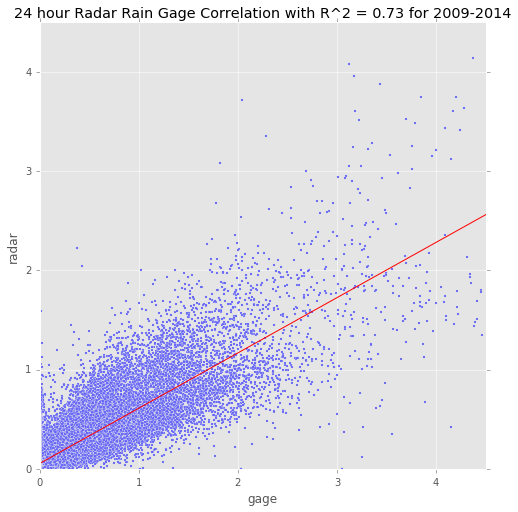

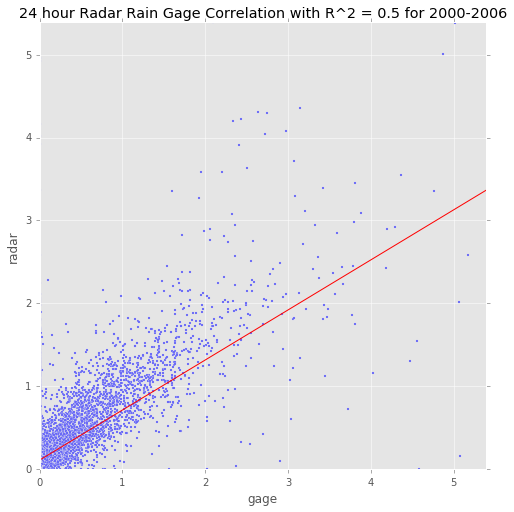

In [80]:
p.plot_correlation(time_step='24H', base=12)
p21.plot_correlation(time_step='24H', base=12)

Now we might find it more interesting to look at temporal trends:

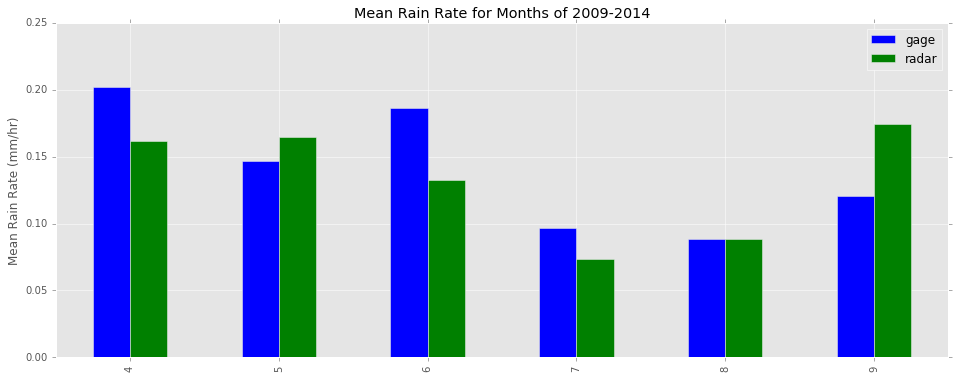

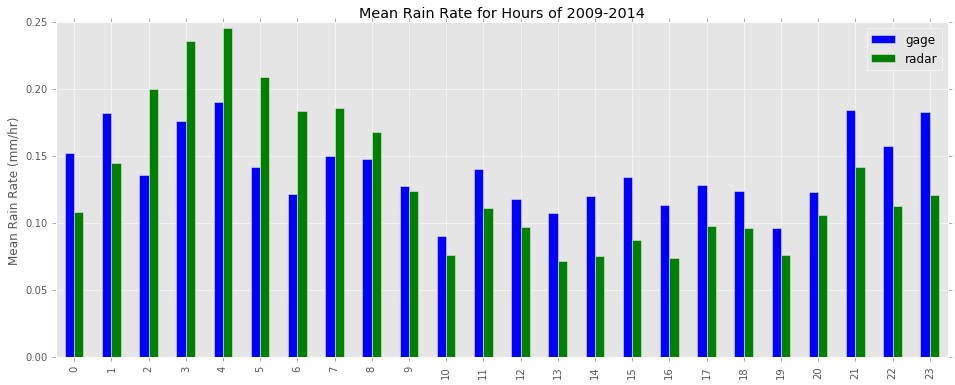

In [114]:
p.plot_rate(interval='seasonal')
p.plot_rate(interval='diurnal')

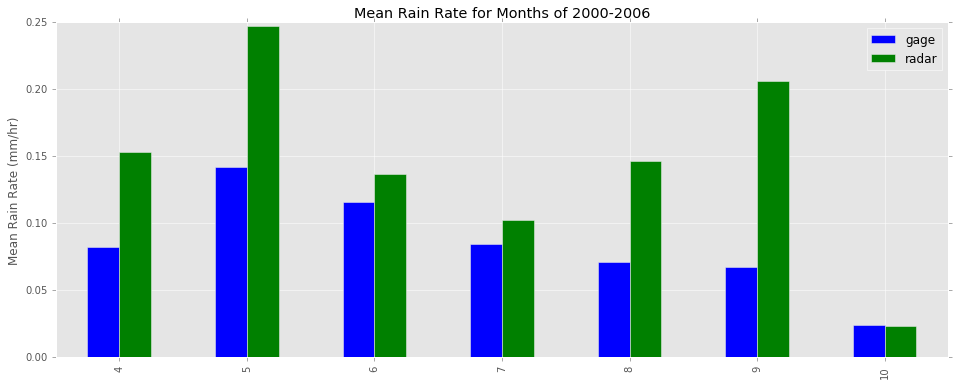

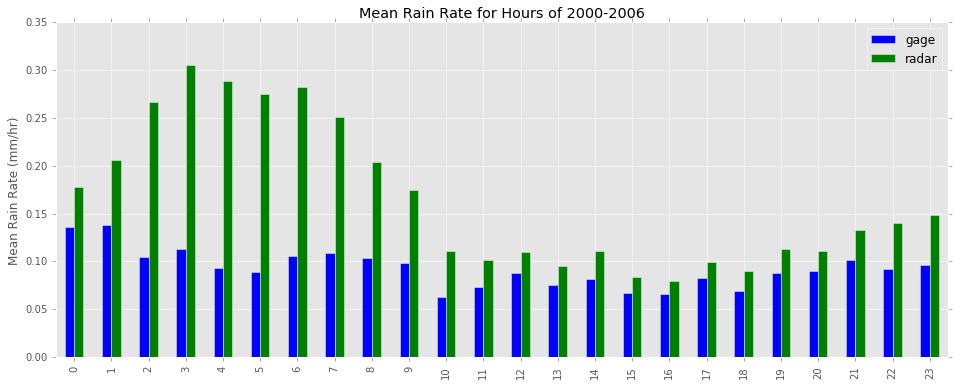

In [17]:
p21.plot_rate(interval='seasonal')
p21.plot_rate(interval='diurnal')

I don't know exaclty what it is about, but there is a very noticeable pattern in the radar data of high values in the hours between 0 and 10. This corresponds roughly to the local nighttime. We can compare just the radar data for the different sets of gages

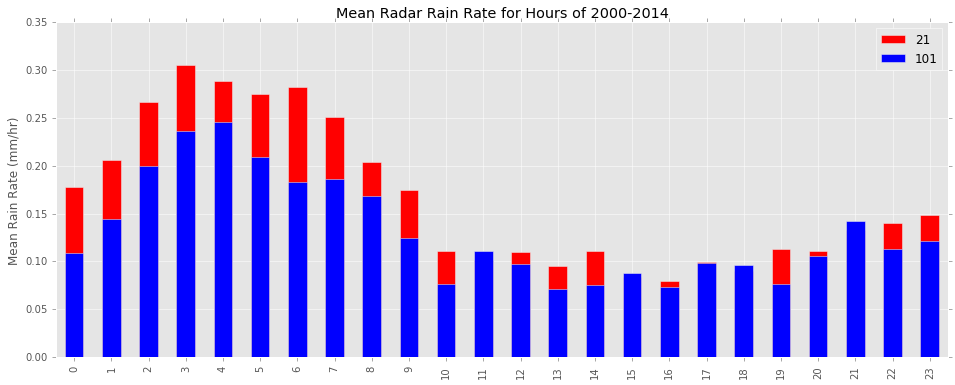

In [115]:
rad21.plot_rate(interval='diurnal', save=False, color='r')
rad.plot_rate(interval='diurnal', save=False, color='b')
plt.legend([21, 101])
title = 'Mean Radar Rain Rate for Hours of 2000-2014'
plt.title(title)
plt.savefig(p.save_path + title + 'jpg')

It can be helpful to look into the probability of a wettness rather that straight rates

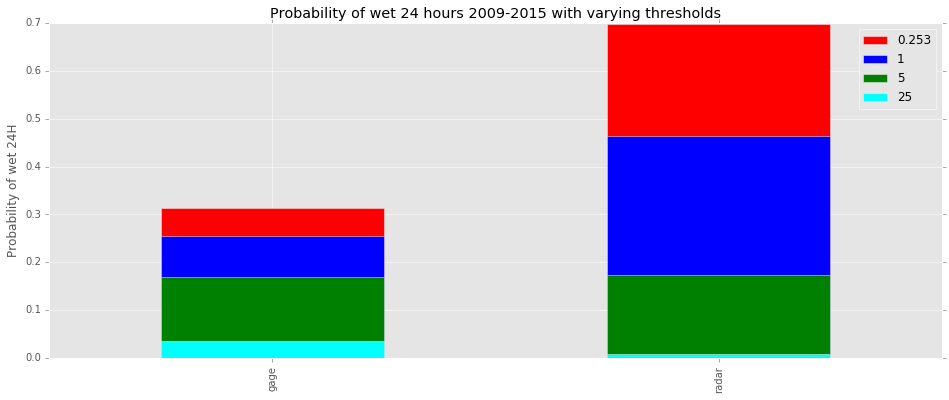

In [107]:
for mm, c in zip([.253, 1, 5, 25], ['red','blue','green','cyan']):
    p.thresh = mm * p.per_hour
    p.plot_prob_wet(time_step='24H', base=12, color=c, save=False)
plt.legend([.253, 1, 5, 25])
title = 'Probability of wet 24 hours 2009-2015 with varying thresholds'
plt.title(title)
plt.savefig(p.save_path + title + 'jpg')

Once we are satisfied with the temporal aspects we can dive into the spatial aspects of the data

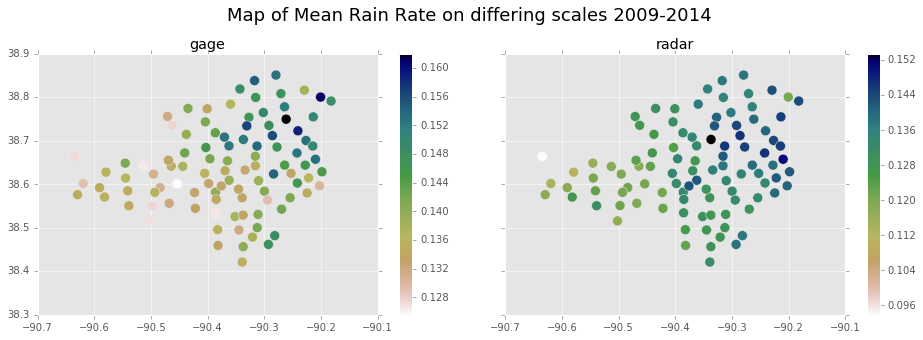

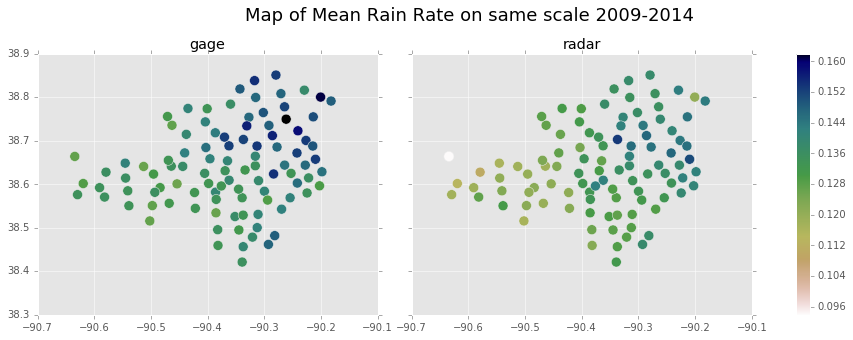

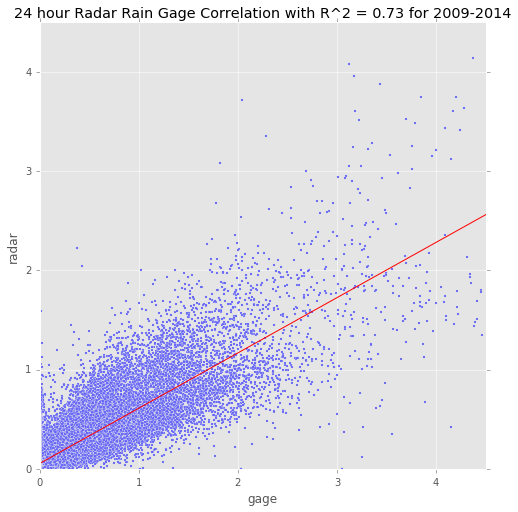

In [74]:
p.plot_rate(gage=p.list_of_gages(), bar=False, map=True, sharec=False)
p.plot_rate(gage=p.list_of_gages(), bar=False, map=True, sharec=True)

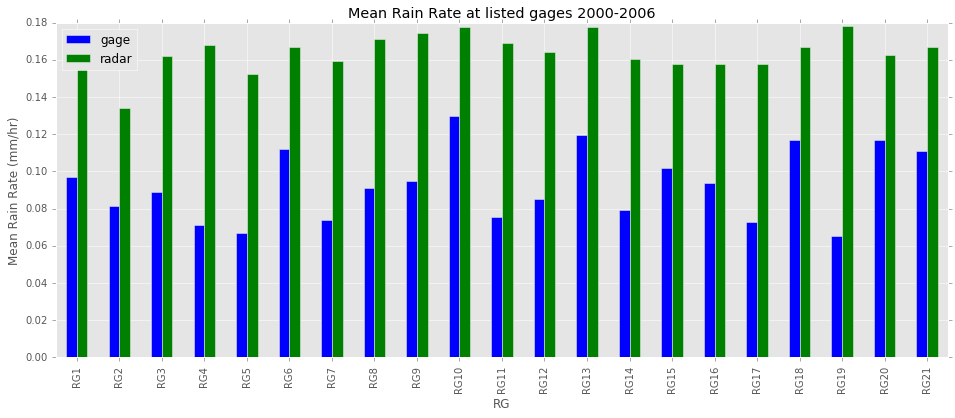

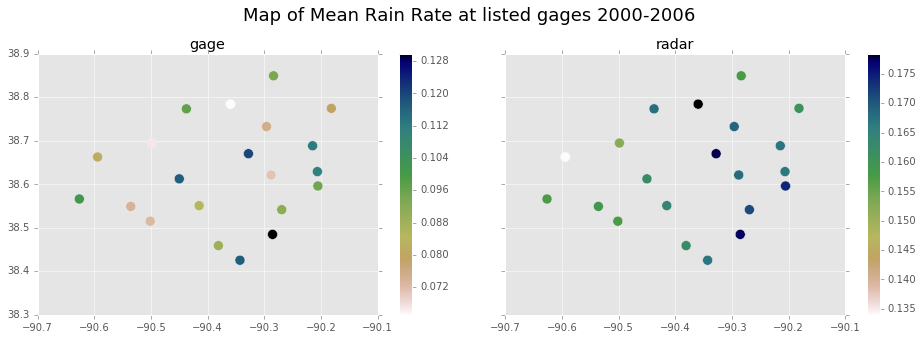

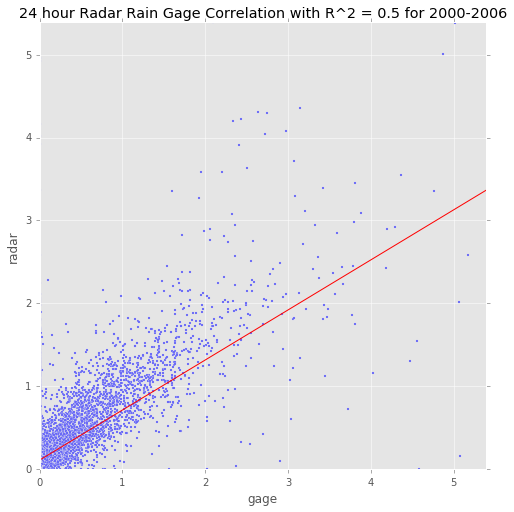

In [15]:
p21.plot_rate(gage=p21.list_of_gages(), bar=False, map=True, sharec=False)
p21.plot_rate(gage=p21.list_of_gages(), bar=False, map=True, sharec=True)

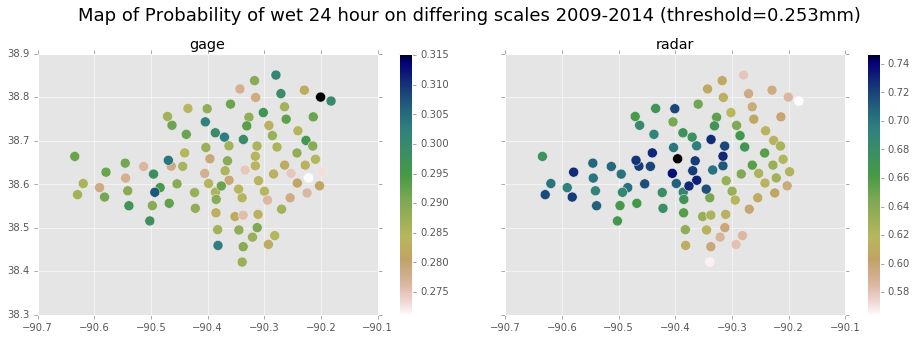

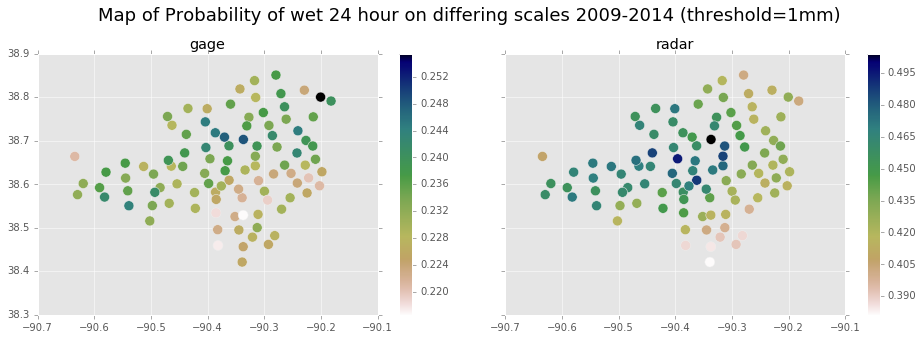

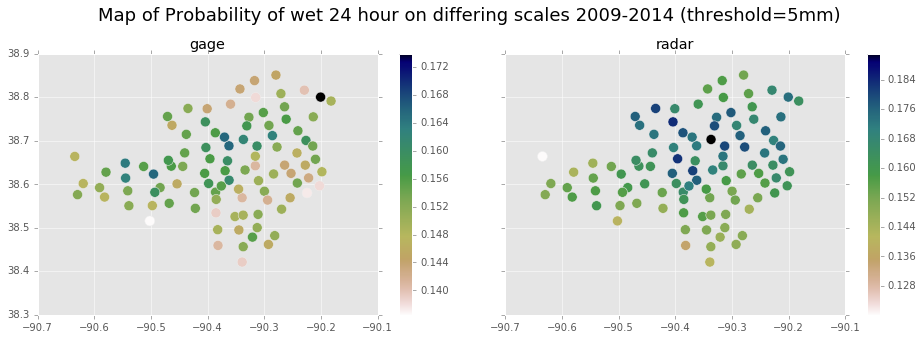

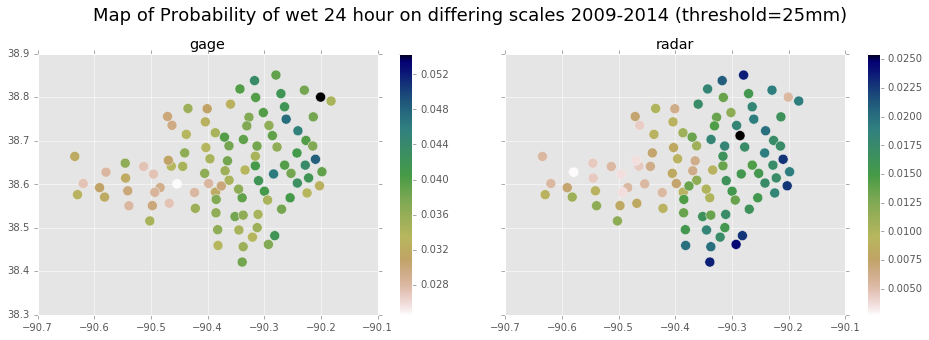

In [76]:
for mm in [.253, 1, 5, 25]:
    p.thresh = mm * p.per_hour
    p.plot_prob_wet(time_step='24H', base=12, gage=list_of_gages(p), bar=False, map=True, sharec=False)

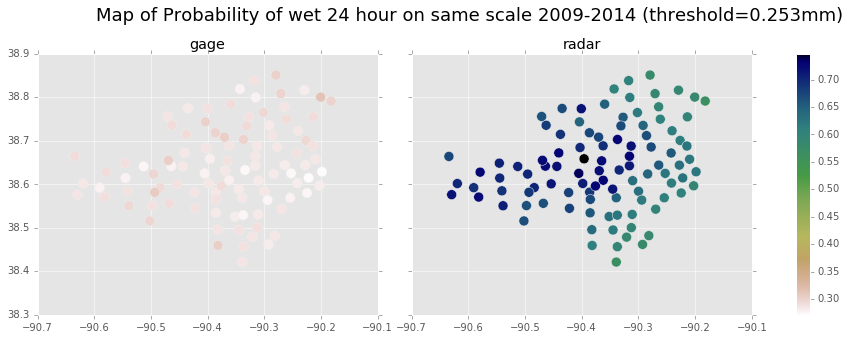

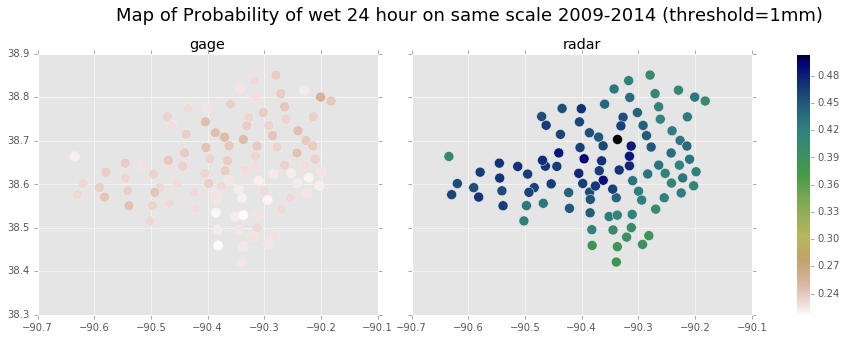

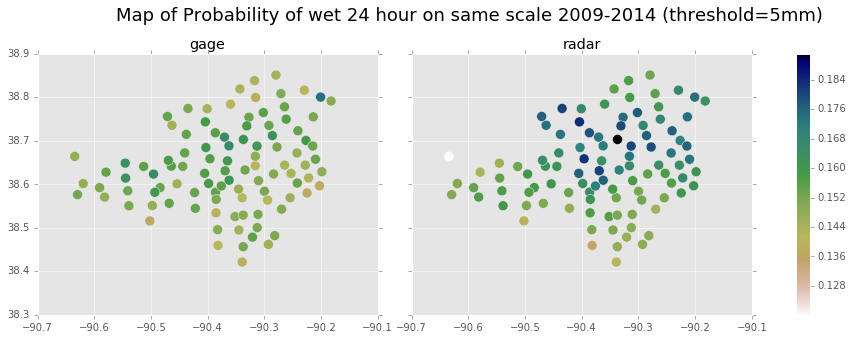

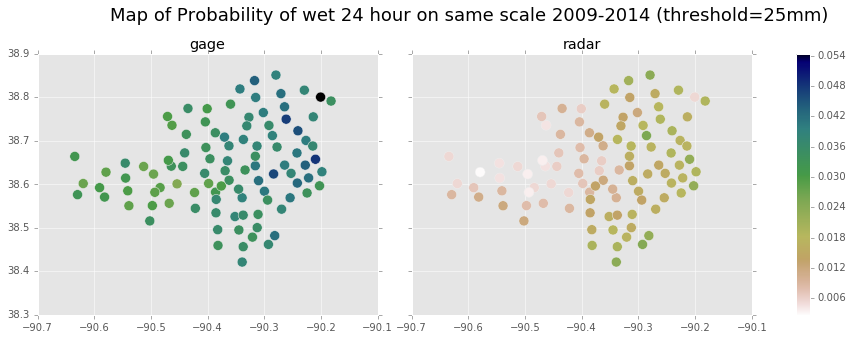

In [78]:
for mm in [.253, 1, 5, 25]:
    p.thresh = mm * p.per_hour
    p.plot_prob_wet(time_step='24H', base=12, gage=list_of_gages(p), bar=False, map=True, sharec=True)

These maps can offer a lot of insight into potentially interesing trends, but at the end of the day, we probably want to get statistical evidnce of these trends. This is where semivariograms come into play. 

In [ ]:
p.plot_ll()

And ultimately we can visualize the combination of the two axes of the data, but showing an animation of one storm at the sites over the course of a couple days

In [ ]:
sec = rg.rate.loc['2009-06-15':'2009-06-17',:]
sec = sec[sec.sum(axis=1) > rg.thresh]
df = rg.ll.join(sec.transpose())
df = df[df.lat > -200]

In [ ]:
movie(df)